# Image Analysis in python


## Setup

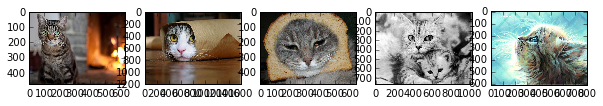

In [1]:
# Bring in necessary libraries
## Adds all the needed python libraries
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
from skimage import color
import skimage.filters as filters
import skimage.exposure as exposure
import skimage.feature as feature
from skimage.transform import hough_circle
from skimage.feature import peak_local_max
from skimage import morphology
from skimage.draw import circle_perimeter
from skimage import img_as_float, img_as_ubyte, img_as_uint
from skimage import segmentation as seg
from skimage.morphology import watershed
from skimage.morphology import disk
from scipy import ndimage as nd
from scipy.ndimage import convolve
import glob # for bulk file import

from skimage import data, img_as_float
from skimage.restoration import denoise_tv_chambolle, denoise_bilateral
from skimage.util.shape import view_as_windows
from skimage.util.montage import montage2d
from skimage.feature import hog
from skimage.transform import PiecewiseAffineTransform, warp
from skimage import io
from skimage.future import graph
from skimage.transform import swirl
from skimage import restoration
from scipy.cluster.vq import kmeans2

# Set defaults
## Sets the default settings for the images. We set the default size,
## and grayscale images are in grayscale.
plt.rcParams['image.cmap'] = 'gray' # Display grayscale images in... grayscale.
plt.rcParams['image.interpolation'] = 'none' # Use nearest-neighbour
plt.rcParams['figure.figsize'] = 10, 10

# Import test images
## Import all of the images that are jpgs and pngs. Save them as
## 8-bit unsigned integer format.
imgpaths = glob.glob("./images/*.jpg") + glob.glob("./images/*.png")
imgset = [img_as_ubyte(mpimg.imread(x)) for x in imgpaths]

# Display thumbnails of the images to ensure loading
## Loads the images as thumbnails. No other changes have been made,
## uses the default settings. Grayscales are still grayscale.
plt.figure()
for i,img in enumerate(imgset):
    plt.subplot(1, len(imgset), i+1)
    plt.imshow(img, cmap = 'gray')

## 1. Denoising a picture

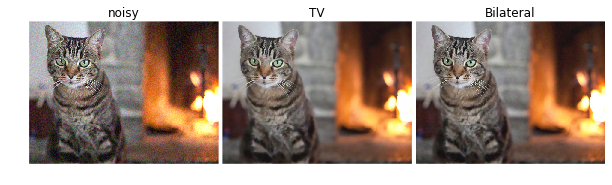

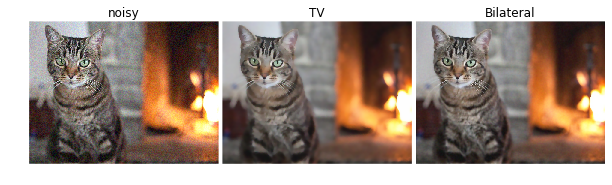

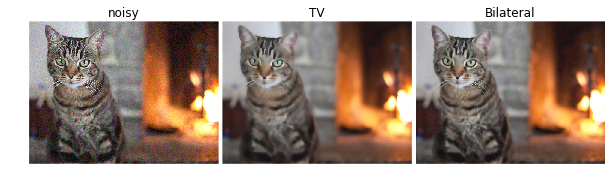

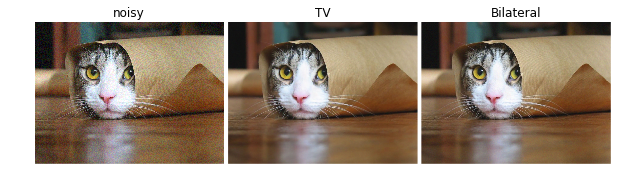

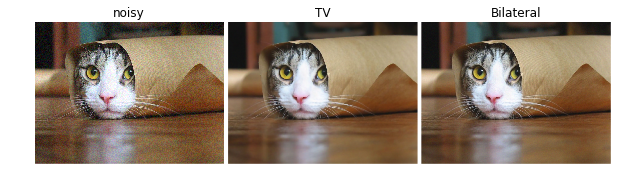

...

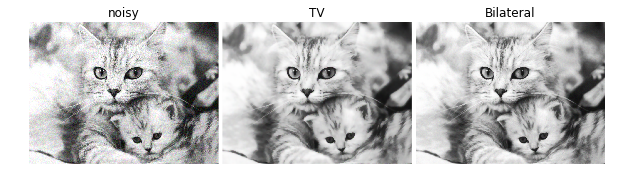

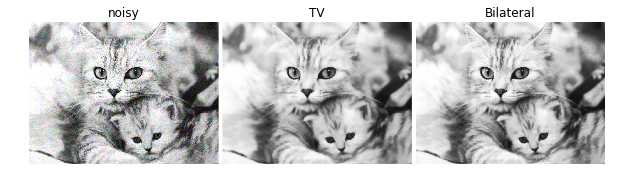

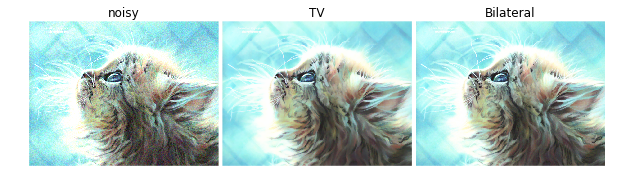

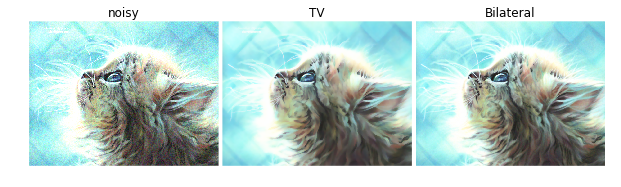

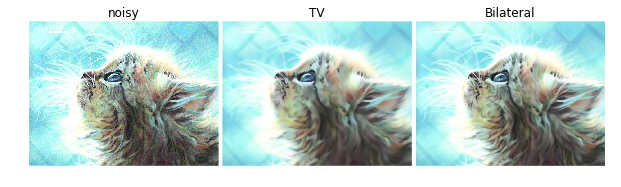

In [2]:
## This algorithm denoises a noisy version. It uses total
## and bilateral denoising filters.
## The technique works on all types of colorspaces (RGB, HSV, and greyscale). 
## The algorithm takes three parameters. It is possible to change
## the degree of posterization by controlling the tradeoff between
## denoising and faithfulness to the original image. The total
## technique weight, bilateral technique sigma range, and the bilateral
## sigma spatial all contribute to the degree of posterization.

def denoising_a_picture(img, total_technique_weight, bilateral_sigma_range, bilateral_sigma_spatial):
    astro = img_as_float(img)

    noisy = astro + 0.6 * astro.std() * np.random.random(astro.shape)
    noisy = np.clip(noisy, 0, 1)

    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 5))

    plt.gray()

    ax[0].imshow(noisy)
    ax[0].axis('off')
    ax[0].set_title('noisy')
    ax[1].imshow(denoise_tv_chambolle(noisy, weight=total_technique_weight, multichannel=True))
    ax[1].axis('off')
    ax[1].set_title('TV')
    ax[2].imshow(denoise_bilateral(noisy, sigma_range=bilateral_sigma_range,
                                   sigma_spatial=bilateral_sigma_spatial))
    ax[2].axis('off')
    ax[2].set_title('Bilateral')

    fig.subplots_adjust(wspace=0.02, hspace=0.2,
                        top=0.9, bottom=0.05, left=0, right=1)

    plt.show()
    
for x in range(len(imgset)):
    denoising_a_picture(imgset[x], .1, .05, 15)
    denoising_a_picture(imgset[x], .2, .10, 30)
    denoising_a_picture(imgset[x], .3, .15, 45)

## 2. Gabors / Primary Visual Cortex “Simple Cells” from an Image

/usr/local/lib/python2.7/site-packages/skimage/util/shape.py:237: RuntimeWarning: Cannot provide views on a non-contiguous input array without copying.
  warn(RuntimeWarning("Cannot provide views on a non-contiguous input "


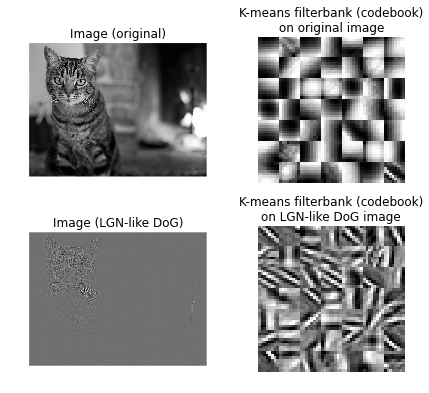

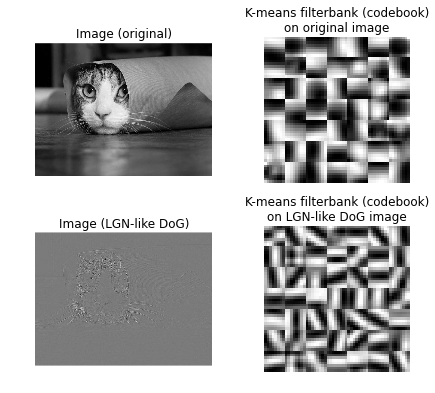

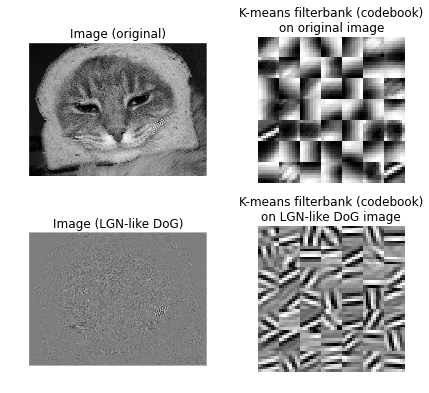

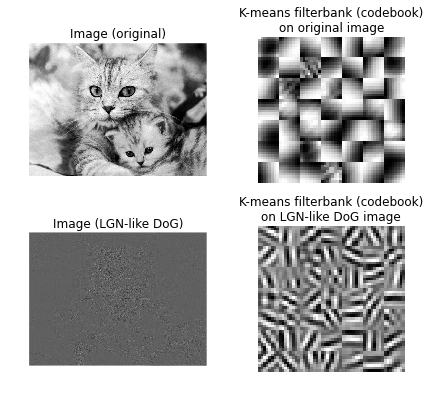

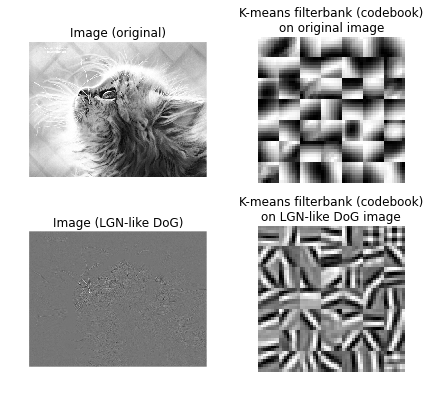

In [3]:
## This simple example shows how to get Gabor-like filters 
## using just a simple image. In image processing, a Gabor 
## filter, named after Dennis Gabor, is a linear filter used
## for edge detection. Frequency and orientation representations
## of Gabor filters are similar to those of the human visual system,
## and they have been found to be particularly appropriate for texture
## representation and discrimination.

## The technique works on RGB and greyscale. It will convert
## the RGB images to greyscale in the algorithm.
## The algorithm does not take any parameters.

def gabors(img):
    astro = color.rgb2gray(img)

    # -- filterbank1 on original image
    patches1 = view_as_windows(astro, patch_shape)
    patches1 = patches1.reshape(-1, patch_shape[0] * patch_shape[1])[::8]
    fb1, _ = kmeans2(patches1, n_filters, minit='points')
    fb1 = fb1.reshape((-1,) + patch_shape)
    fb1_montage = montage2d(fb1, rescale_intensity=True)

    # -- filterbank2 LGN-like image
    astro_dog = nd.gaussian_filter(astro, .5) - nd.gaussian_filter(astro, 1)
    patches2 = view_as_windows(astro_dog, patch_shape)
    patches2 = patches2.reshape(-1, patch_shape[0] * patch_shape[1])[::8]
    fb2, _ = kmeans2(patches2, n_filters, minit='points')
    fb2 = fb2.reshape((-1,) + patch_shape)
    fb2_montage = montage2d(fb2, rescale_intensity=True)

    # --
    fig, axes = plt.subplots(2, 2, figsize=(7, 6))
    ax0, ax1, ax2, ax3 = axes.ravel()

    ax0.imshow(astro, cmap=plt.cm.gray)
    ax0.set_title("Image (original)")

    ax1.imshow(fb1_montage, cmap=plt.cm.gray, interpolation='nearest')
    ax1.set_title("K-means filterbank (codebook)\non original image")

    ax2.imshow(astro_dog, cmap=plt.cm.gray)
    ax2.set_title("Image (LGN-like DoG)")

    ax3.imshow(fb2_montage, cmap=plt.cm.gray, interpolation='nearest')
    ax3.set_title("K-means filterbank (codebook)\non LGN-like DoG image")

    for ax in axes.ravel():
        ax.axis('off')

    fig.subplots_adjust(hspace=0.3)
    plt.show()
    
np.random.seed(42)

patch_shape = 8, 8
n_filters = 49
    
for x in range(len(imgset)):
    gabors(imgset[x])

## 3. Histogram of Oriented Gradients

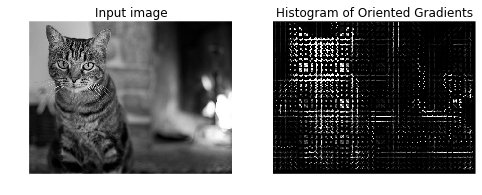

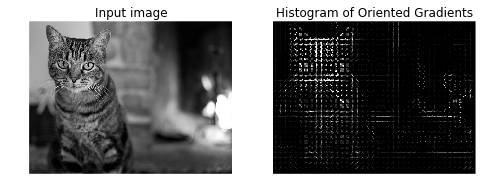

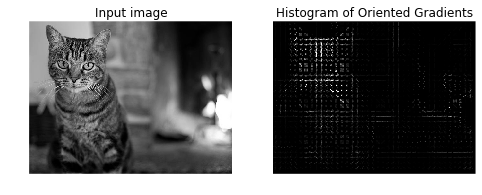

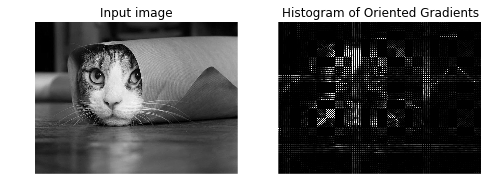

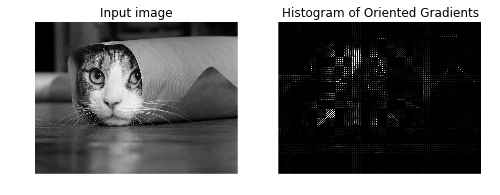

...

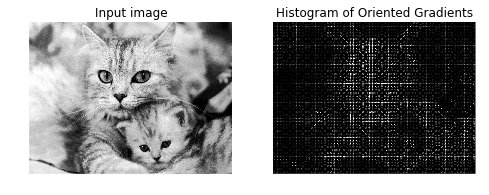

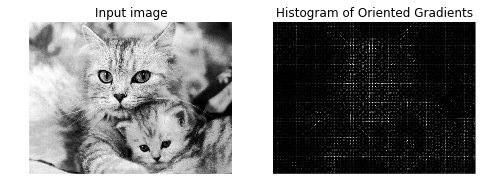

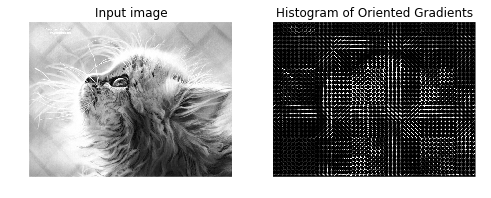

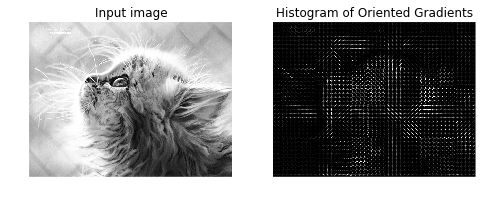

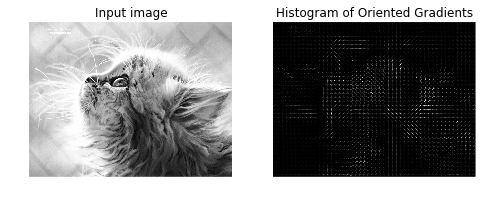

In [4]:
## Compute a Histogram of Oriented Gradients (HOG) by
## - (optional) global image normalisation
## - computing the gradient image in x and y
## - computing gradient histograms
## - normalising across blocks
## - flattening into a feature vector

## The technique works on RGB and greyscale. It will convert
## the RGB images to greyscale in the algorithm. The algorithm 
## takes an intensity range as a parameter. A lower number
## results in a higher intensity.
def histogram_of_oriented_gradients(img, bot, top):
    image = color.rgb2gray(img)

    fd, hog_image = hog(image, orientations=8, pixels_per_cell=(16, 16),
                        cells_per_block=(1, 1), visualise=True)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4))

    ax1.axis('off')
    ax1.imshow(image, cmap=plt.cm.gray)
    ax1.set_title('Input image')

    # Rescale histogram for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(bot, top))

    ax2.axis('off')
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title('Histogram of Oriented Gradients')
    plt.show()
    
for x in range(len(imgset)):
    histogram_of_oriented_gradients(imgset[x], 0, .02)
    histogram_of_oriented_gradients(imgset[x], 0, .05)
    histogram_of_oriented_gradients(imgset[x], 0, .10)

## 4. Gamma and log contrast adjustment

/usr/local/lib/python2.7/site-packages/skimage/exposure/exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warnings.warn("This might be a color image. The histogram will be "


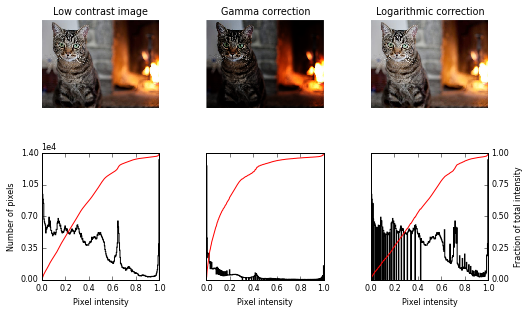

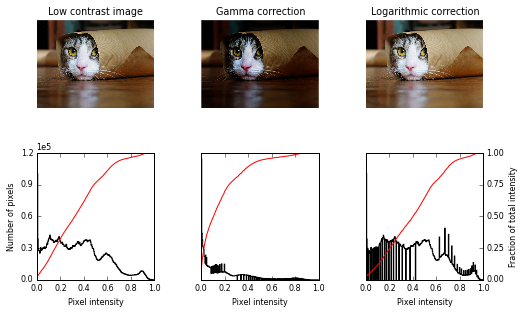

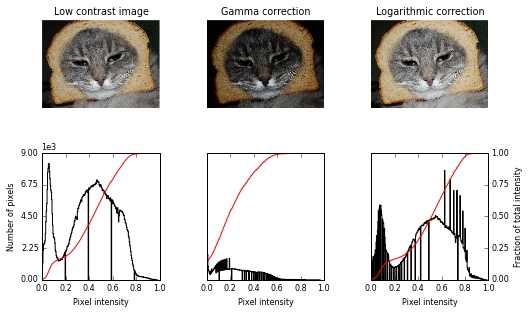

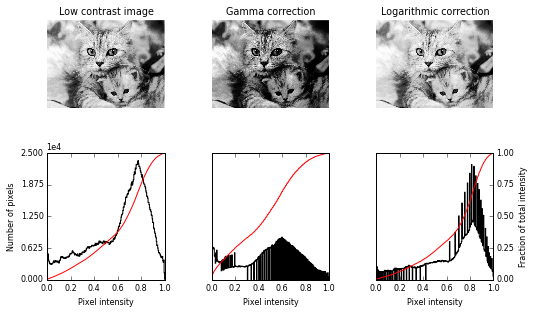

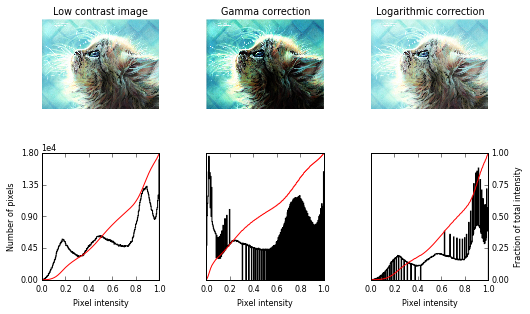

In [5]:
## This example adjusts image contrast by performing a Gamma
## and a Logarithmic correction on the input image. The
## technique works on RGB, HSV, and greyscale. It does
## not take a parameter.

matplotlib.rcParams['font.size'] = 8

def plot_img_and_hist(img, axes, bins=256):
    """Plot an image along with its histogram and cumulative histogram.

    """
    img = img_as_float(img)
    ax_img, ax_hist = axes
    ax_cdf = ax_hist.twinx()

    # Display image
    ax_img.imshow(img, cmap=plt.cm.gray)
    ax_img.set_axis_off()

    # Display histogram
    ax_hist.hist(img.ravel(), bins=bins, histtype='step', color='black')
    ax_hist.ticklabel_format(axis='y', style='scientific', scilimits=(0, 0))
    ax_hist.set_xlabel('Pixel intensity')
    ax_hist.set_xlim(0, 1)
    ax_hist.set_yticks([])

    # Display cumulative distribution
    img_cdf, bins = exposure.cumulative_distribution(img, bins)
    ax_cdf.plot(bins, img_cdf, 'r')
    ax_cdf.set_yticks([])

    return ax_img, ax_hist, ax_cdf

def gamma_and_log_contrast_adjustment(img):
    # Gamma
    gamma_corrected = exposure.adjust_gamma(img, 2)

    # Logarithmic
    logarithmic_corrected = exposure.adjust_log(img, 1)

    # Display results
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(8, 5))

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(img, axes[:, 0])
    ax_img.set_title('Low contrast image')

    y_min, y_max = ax_hist.get_ylim()
    ax_hist.set_ylabel('Number of pixels')
    ax_hist.set_yticks(np.linspace(0, y_max, 5))

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(gamma_corrected, axes[:, 1])
    ax_img.set_title('Gamma correction')

    ax_img, ax_hist, ax_cdf = plot_img_and_hist(logarithmic_corrected, axes[:, 2])
    ax_img.set_title('Logarithmic correction')

    ax_cdf.set_ylabel('Fraction of total intensity')
    ax_cdf.set_yticks(np.linspace(0, 1, 5))

    # prevent overlap of y-axis labels
    fig.subplots_adjust(wspace=0.4)
    plt.show()

for x in range(len(imgset)):
    gamma_and_log_contrast_adjustment(imgset[x])

## 5. RAG Thresholding

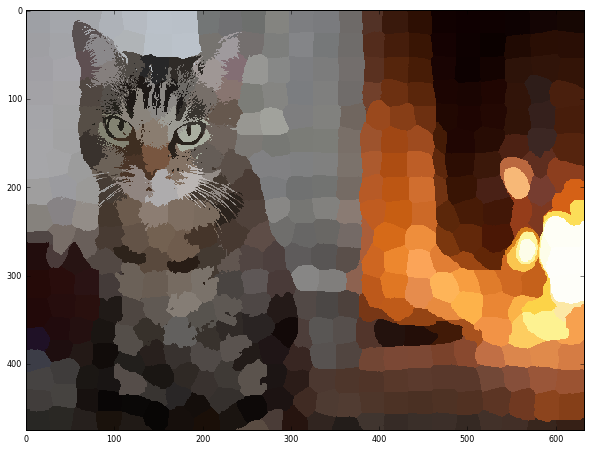

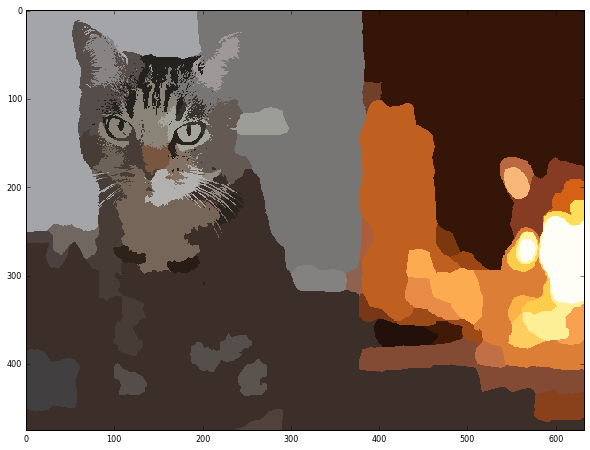

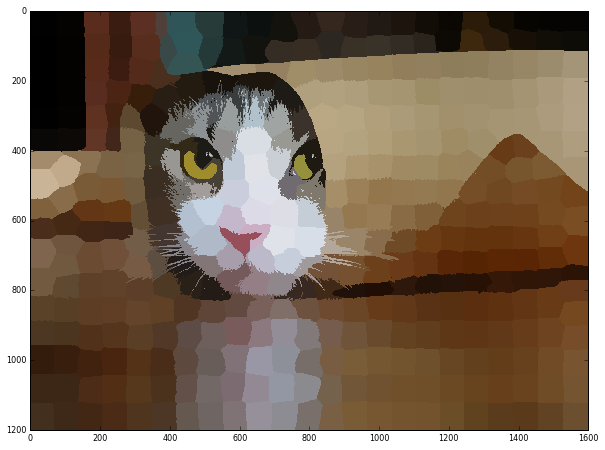

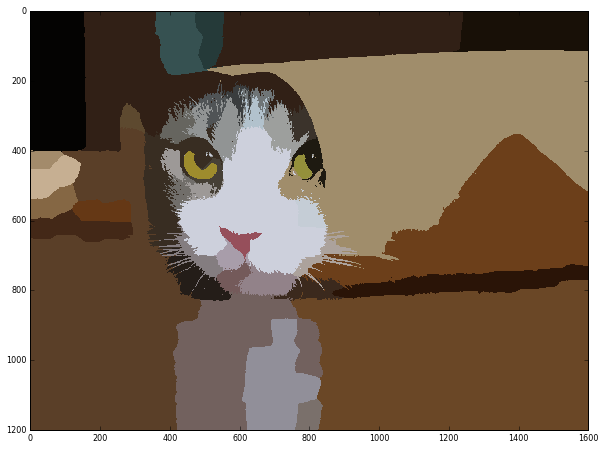

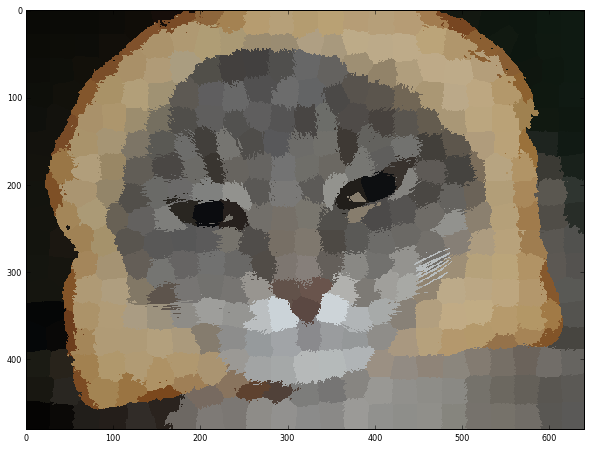

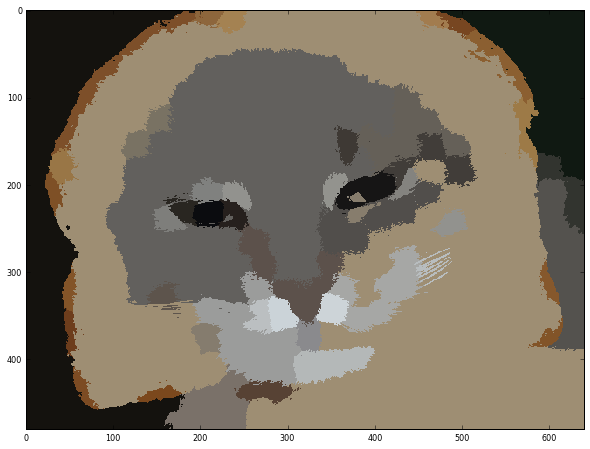

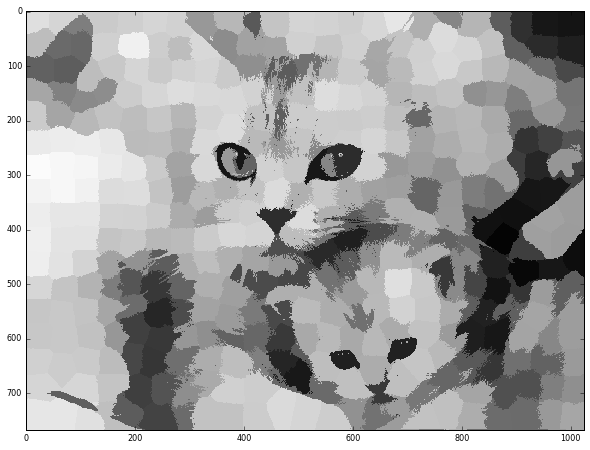

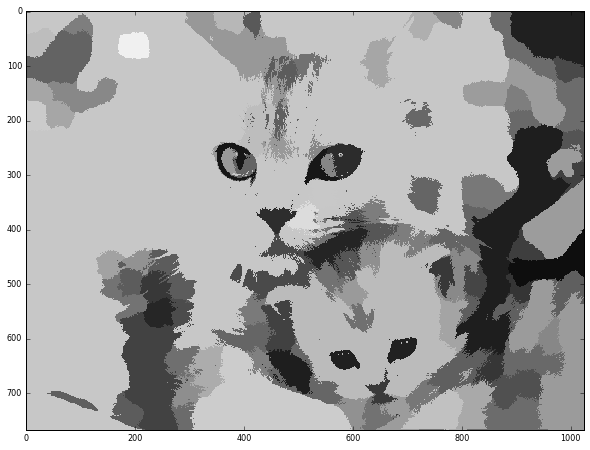

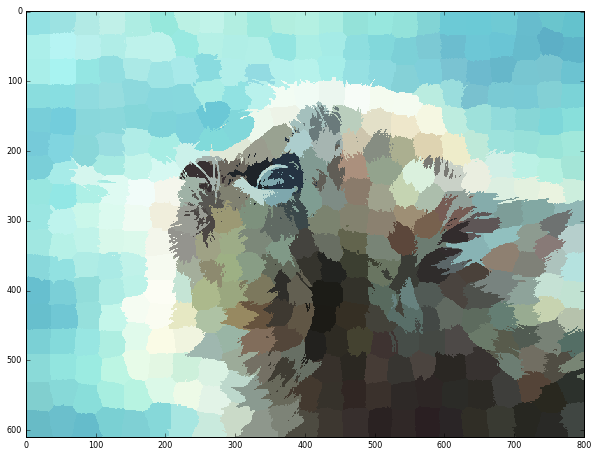

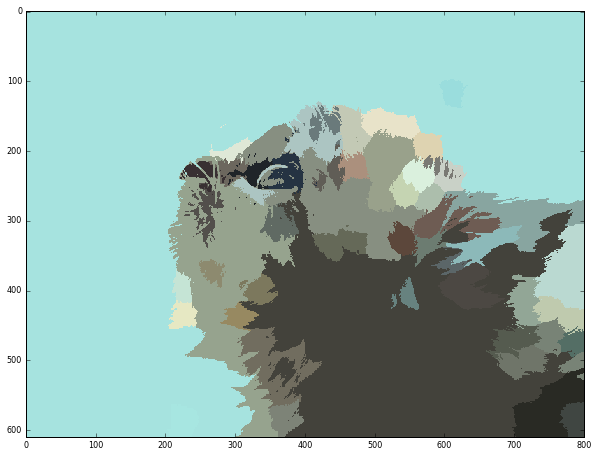

In [6]:
## This algorithm constructs a Region Adjacency Graph (RAG).
## It basically combines regions that are similar in color.
## From the RAG graph we join regions with similar mean color.
## The technique works on all types of colorspaces. It'll convert
## the image to RGB in the algorithm. The algorithm does not
## take any parameters.

def RAG_thresholding(img):
    labels1 = seg.slic(img, compactness=30, n_segments=400)
    out1 = color.label2rgb(labels1, img, kind='avg')

    g = graph.rag_mean_color(img, labels1)
    labels2 = graph.cut_threshold(labels1, g, 29)
    out2 = color.label2rgb(labels2, img, kind='avg')

    plt.figure()
    io.imshow(out1)
    plt.figure()
    io.imshow(out2)
    io.show()

for x in range(len(imgset)):
    RAG_thresholding(imgset[x])

## 6. Piecewise Affine Transformation

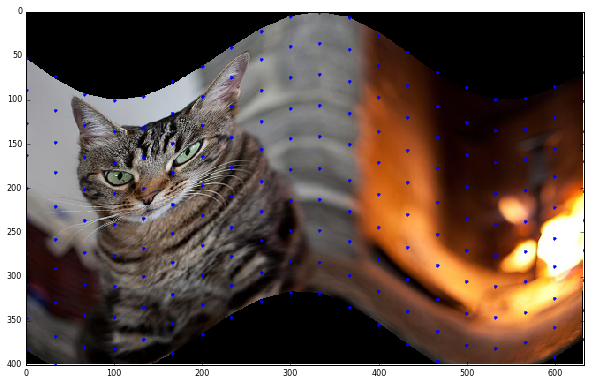

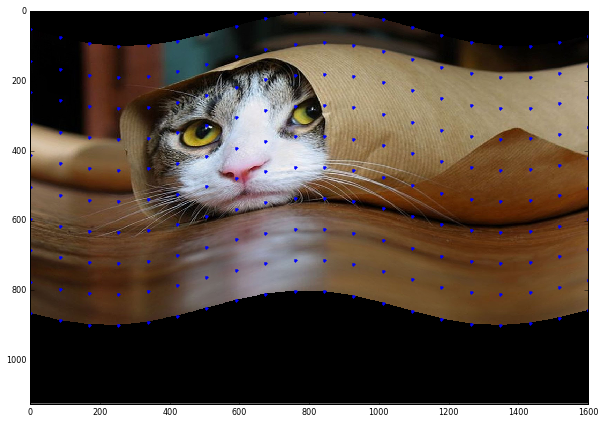

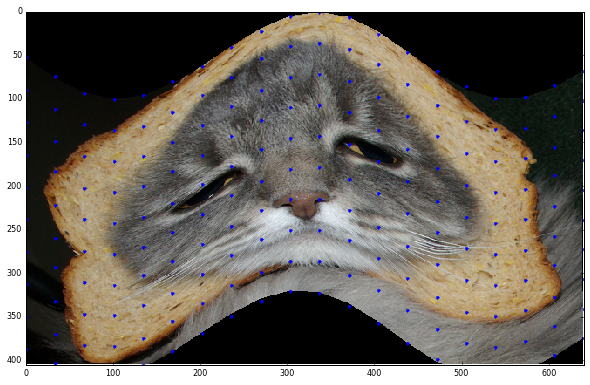

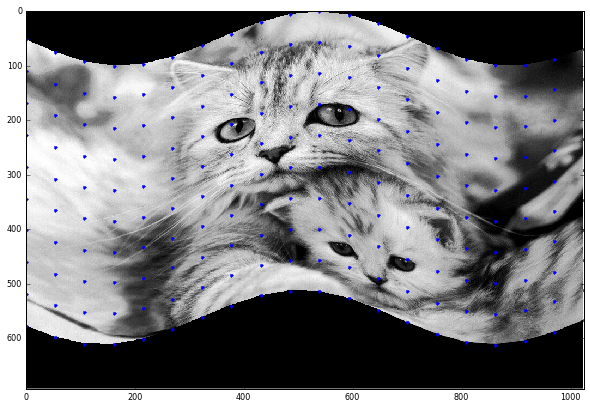

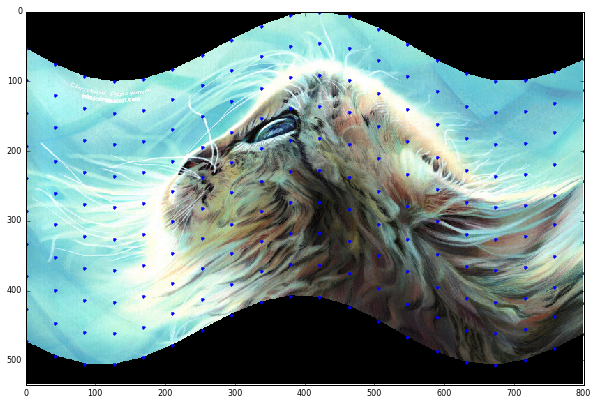

In [7]:
## This example shows how to use the Piecewise Affine Transformation.
## It looks like the image was put on a flag. The technique works on
## all types of colorspaces, and it does not take in a parameter.

def piecewise_affline_transformation(image):
    rows, cols = image.shape[0], image.shape[1]

    src_cols = np.linspace(0, cols, 20)
    src_rows = np.linspace(0, rows, 10)
    src_rows, src_cols = np.meshgrid(src_rows, src_cols)
    src = np.dstack([src_cols.flat, src_rows.flat])[0]

    # add sinusoidal oscillation to row coordinates
    dst_rows = src[:, 1] - np.sin(np.linspace(0, 3 * np.pi, src.shape[0])) * 50
    dst_cols = src[:, 0]
    dst_rows *= 1.5
    dst_rows -= 1.5 * 50
    dst = np.vstack([dst_cols, dst_rows]).T


    tform = PiecewiseAffineTransform()
    tform.estimate(src, dst)

    out_rows = image.shape[0] - 1.5 * 50
    out_cols = cols
    out = warp(image, tform, output_shape=(out_rows, out_cols))

    fig, ax = plt.subplots()
    ax.imshow(out)
    ax.plot(tform.inverse(src)[:, 0], tform.inverse(src)[:, 1], '.b')
    ax.axis((0, out_cols, out_rows, 0))
    plt.show()
    
for x in range(len(imgset)):
    piecewise_affline_transformation(imgset[x])

## 7. Swirl

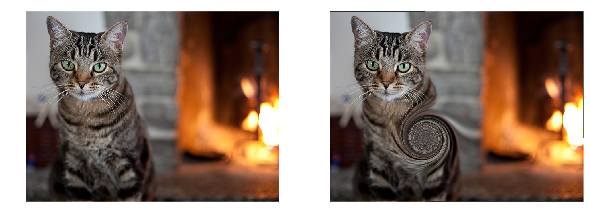

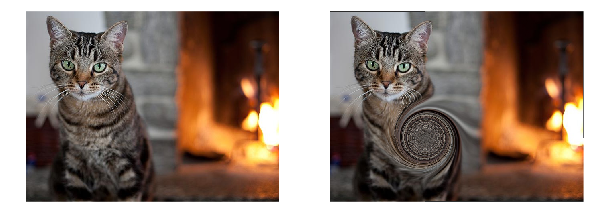

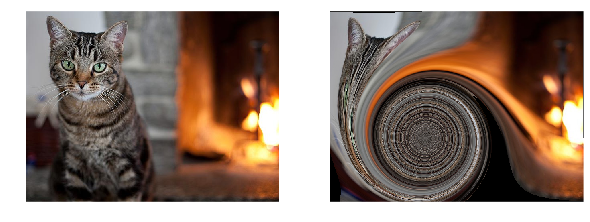

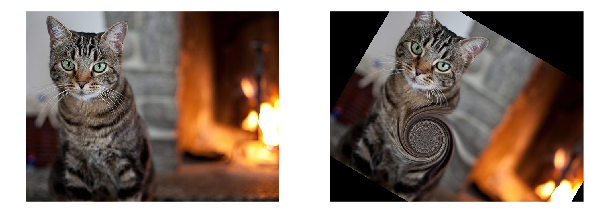

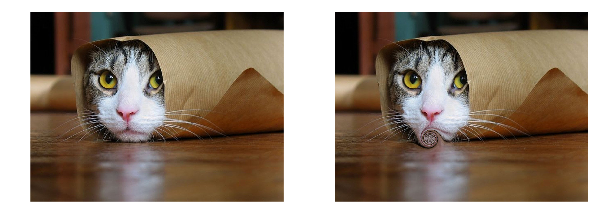

...

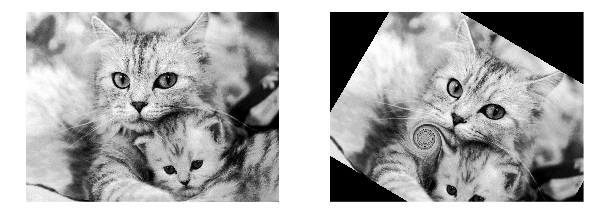

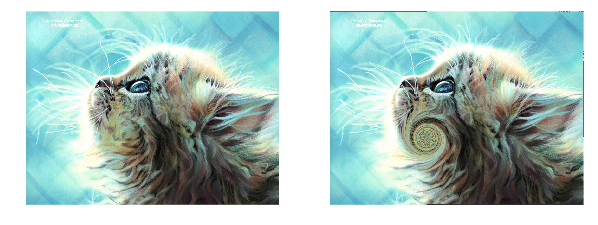

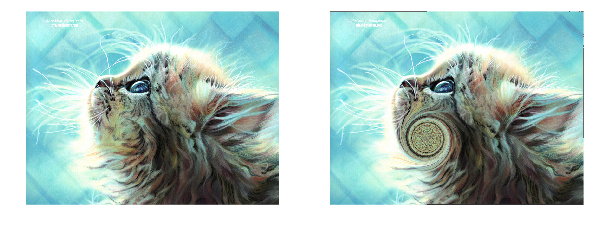

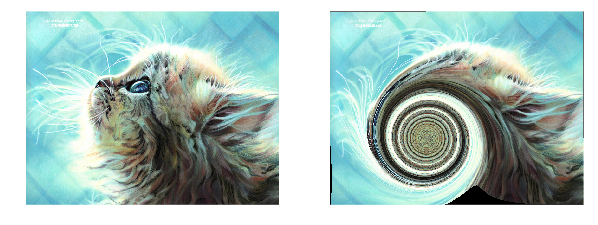

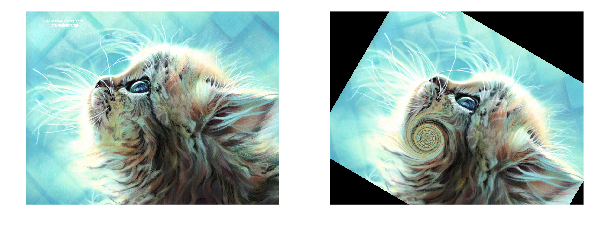

In [8]:
## This algorithm creates a whirlpool effect on the image.
## The technique works on all types of colorspaces (RGB, HSV, Greyscale)
## The swirl algorithm takes in a rotation, a strength,
## and a radius. The strength determines the overall
## strength of the swirl. How much it pulls with it.
## The radius determines how big the original swirl is,
## and the rotation determines how much the entire picture
## should rotate.

def swirl_algo(image, rot, stre, rad):
    swirled = swirl(image, rotation=rot, strength=stre, radius=rad)

    fig, (ax0, ax1) = plt.subplots(1, 2)

    ax0.imshow(image, cmap=plt.cm.gray, interpolation='none')
    ax0.axis('off')
    ax1.imshow(swirled, cmap=plt.cm.gray, interpolation='none')
    ax1.axis('off')

    plt.show()
    
for x in range(len(imgset)):
    swirl_algo(imgset[x], 0, 100, 100)
    swirl_algo(imgset[x], 0, 300, 100)
    swirl_algo(imgset[x], 0, 100, 300)
    swirl_algo(imgset[x], 100, 100, 100)

## 8. Image Deconvolution

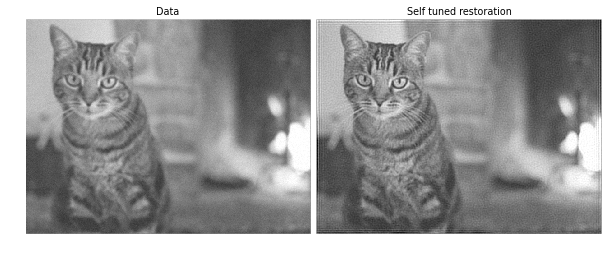

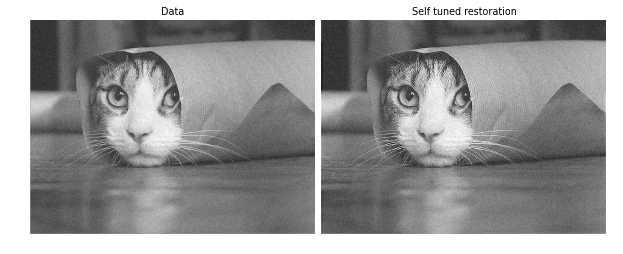

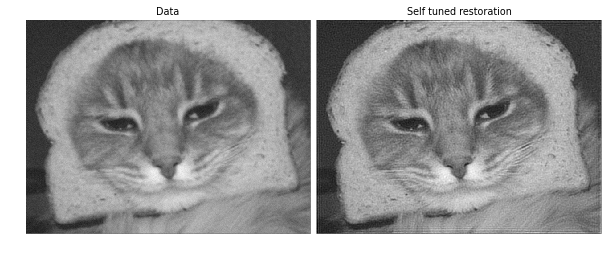

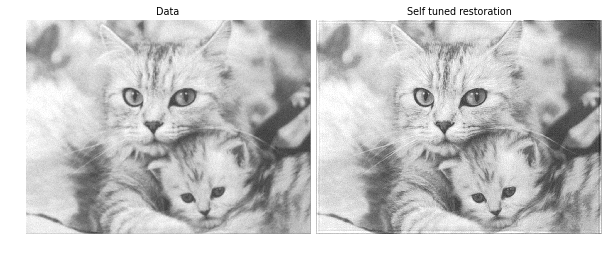

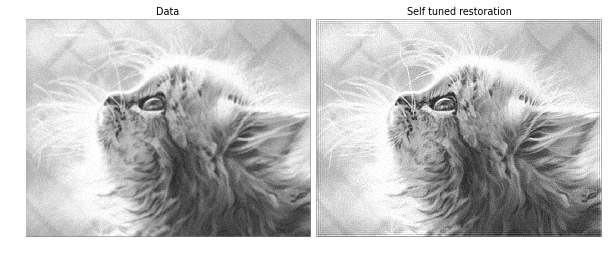

In [9]:
## This algorithm deconvolves a noisy version of an image using 
## Wiener algorithms. The algorithm is based on linear models that
## restore sharp edges. The technique works on rgb but not really.
## It will turn the images into greyscale and then run the algorithm.
## It does not rely on a parameter.

def image_deconvolution(image):
    img = color.rgb2gray(image)
    from scipy.signal import convolve2d as conv2
    psf = np.ones((5, 5)) / 25
    img = conv2(img, psf, 'same')
    img += 0.1 * img.std() * np.random.standard_normal(img.shape)

    deconvolved, _ = restoration.unsupervised_wiener(img, psf)

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 5))

    plt.gray()

    ax[0].imshow(img, vmin=deconvolved.min(), vmax=deconvolved.max())
    ax[0].axis('off')
    ax[0].set_title('Data')

    ax[1].imshow(deconvolved)
    ax[1].axis('off')
    ax[1].set_title('Self tuned restoration')

    fig.subplots_adjust(wspace=0.02, hspace=0.2,
                        top=0.9, bottom=0.05, left=0, right=1)

    plt.show()
    
for x in range(len(imgset)):
    image_deconvolution(imgset[x])